In [162]:
import numpy as np
import torch
import  torch.nn as nn
import torch.optim as optim
import PIL.Image

In [163]:
import matplotlib.pyplot as plt

In [164]:
import torchvision.transforms as transforms
import torchvision.models

In [165]:
from  PIL import Image

In [166]:
from torchvision import models

In [167]:
device = "cuda"

In [168]:
imsize = 224
loader = transforms.Compose([transforms.Resize(imsize), transforms.ToTensor(), transforms.Normalize((0.485, 0.456,0.406),(0.229, 0.224, 0.225 ))])

In [169]:
def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image

In [170]:
content_image = image_loader("dog.jpg").to(device)

In [171]:
style_img = image_loader("matisse.jpg").to(device)

In [172]:
unloader = transforms.Compose([transforms.Normalize((-0.485/0.229,-0.456/0.224,-0.406/0.225), (1/0.229, 1/0.224, 1/0.225)),transforms.ToPILImage()])

In [173]:
def tensor2image(tensor):
    image = tensor.to('cpu').clone()
    image  = image.squeeze(0)
    image = unloader(image)
    return image

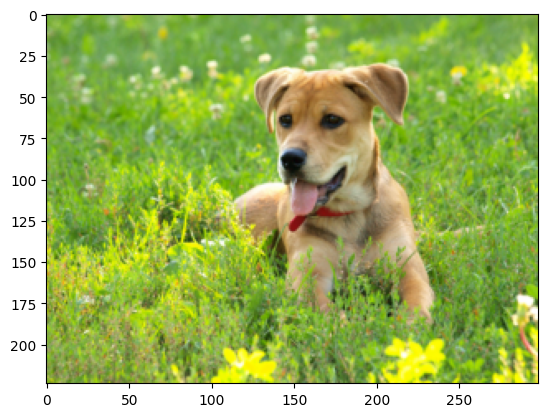

In [174]:
plt.figure()
plt.imshow(tensor2image(content_image))

In [175]:
model = models.vgg19(pretrained = True).features

In [176]:
model.parameters()

<generator object Module.parameters at 0x00000208614D5070>

In [177]:
for param in model.parameters():
    param.requires_grad_(False)

In [178]:
model.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [179]:
relevant_layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19':'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}

In [180]:
def features_extractor(x, model, layers):
    features = {}
    for index, layer in model._modules.items():
        x = layer(x)
        if index in layers:
            features[layers[index]] = x
    return features

In [181]:
content_features = features_extractor(content_image, model, relevant_layers)

In [182]:
style_features = features_extractor(style_img,  model, relevant_layers)

In [183]:
style_grams = {}
for i in style_features:
    layer = style_features[i]
    _, d1, d2, d3 = layer.shape
    features = layer.view(d1, d2*d3)
    gram = torch.mm(features, features.t())
    style_grams[i] = gram

In [184]:
target_img = content_image.clone().requires_grad_(True).to(device)

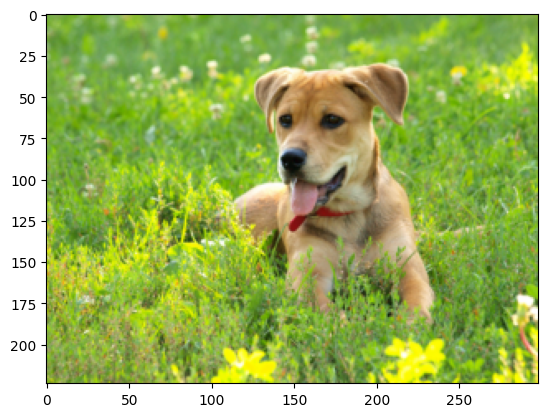

In [185]:
plt.figure()
plt.imshow(tensor2image(target_img))

In [186]:
target_img

tensor([[[[-0.1828, -0.1657, -0.0629,  ...,  0.1939,  0.2453,  0.3481],
          [-0.1486, -0.0972, -0.0629,  ...,  0.1083,  0.1597,  0.1939],
          [-0.1143, -0.0801, -0.0801,  ...,  0.0227,  0.0569,  0.0741],
          ...,
          [ 0.1083,  0.3309,  0.7591,  ...,  0.6906,  1.7694,  2.2147],
          [ 0.1254,  0.1939,  0.5193,  ...,  0.7248,  1.5297,  2.1119],
          [ 0.2624,  0.0569, -0.0629,  ...,  0.7762,  1.3927,  1.9235]],

         [[ 0.8704,  0.9055,  0.9405,  ...,  1.0980,  1.1155,  1.1681],
          [ 0.9230,  0.9405,  0.9580,  ...,  1.0105,  1.0455,  1.0455],
          [ 0.9230,  0.9580,  0.9755,  ...,  0.9230,  0.9405,  0.9580],
          ...,
          [ 0.9930,  1.1506,  1.3081,  ...,  1.4132,  1.7808,  2.1134],
          [ 0.9405,  1.0630,  1.0980,  ...,  1.5182,  1.6408,  1.9909],
          [ 0.9930,  1.0805,  0.6954,  ...,  1.4482,  1.6583,  2.0434]],

         [[-0.5844, -0.5670, -0.4973,  ..., -0.6367, -0.7587, -0.8633],
          [-0.6018, -0.5495, -

In [187]:
style_weights = {'conv1_1':1, 'conv2_1':0.8, 'conv3_1': 0.6, 'conv4_1': 0.4, 'conv5_1': 0.2}

In [188]:
alpha = 1
beta = 1e5

In [189]:
style_features['conv1_1'].shape

torch.Size([1, 64, 224, 305])

In [190]:
print_statement = 500
optimizer = torch.optim.Adam([target_img], lr=0.001)
iterations = 10000

Total loss:  44246620.0


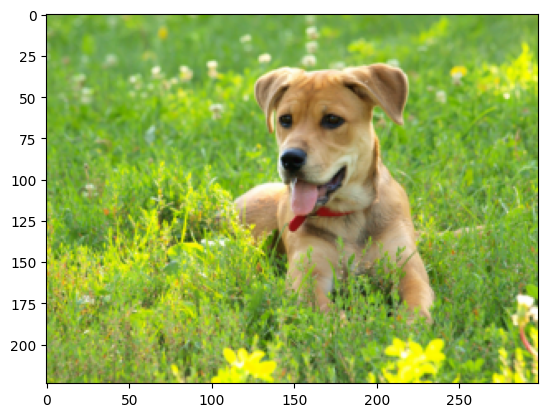

Total loss:  13406327.0


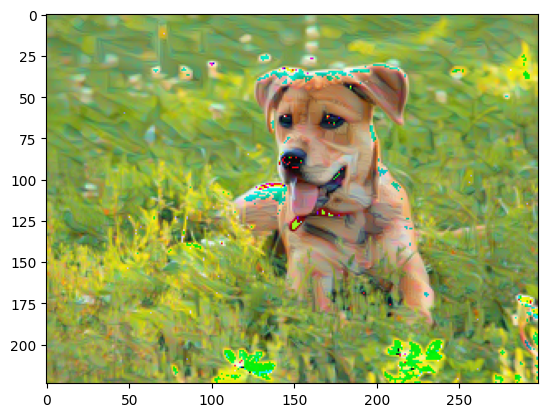

Total loss:  8630977.0


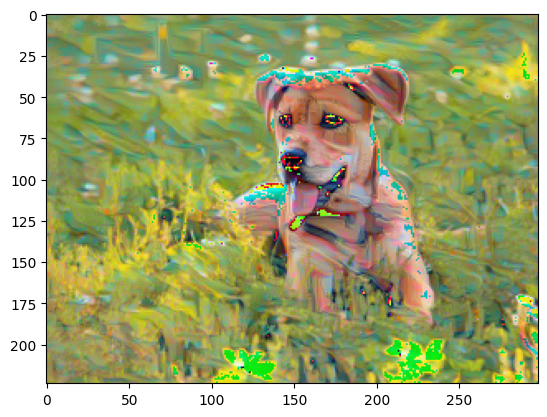

Total loss:  6482242.5


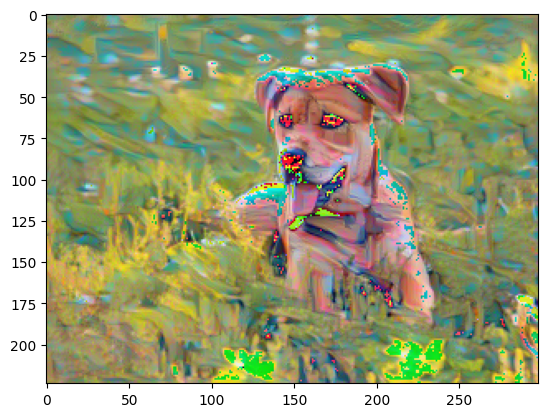

Total loss:  4399599.5


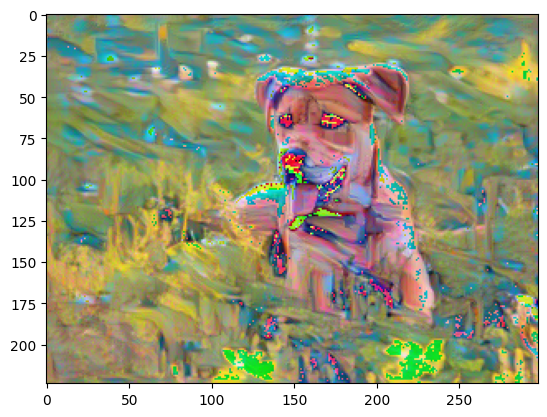

Total loss:  2072952.875


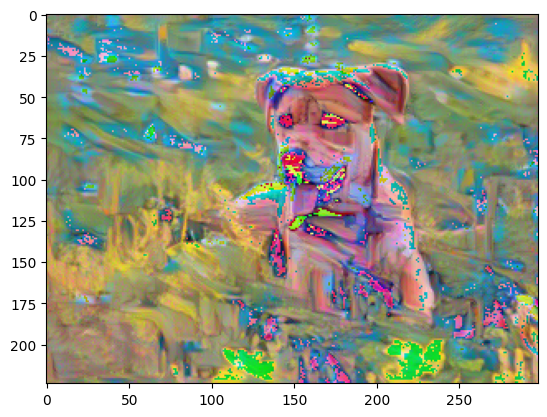

Total loss:  752142.8125


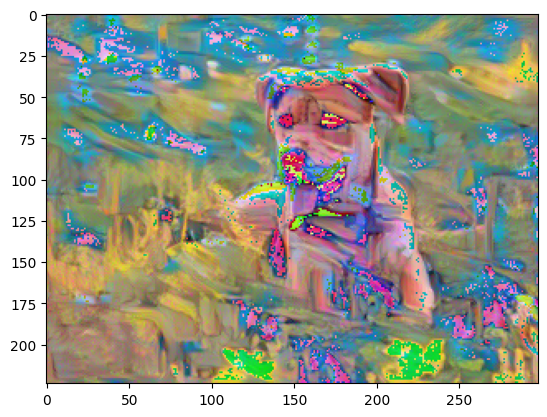

Total loss:  414987.28125


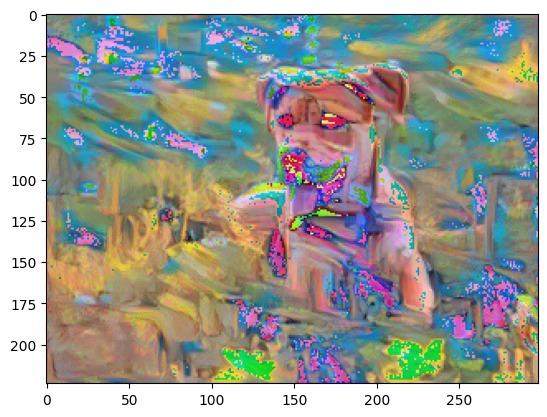

Total loss:  316355.8125


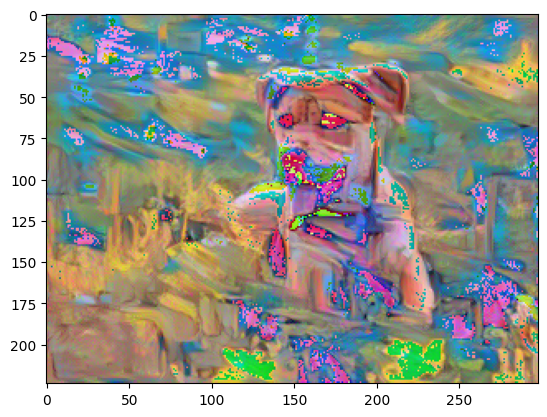

Total loss:  261209.3125


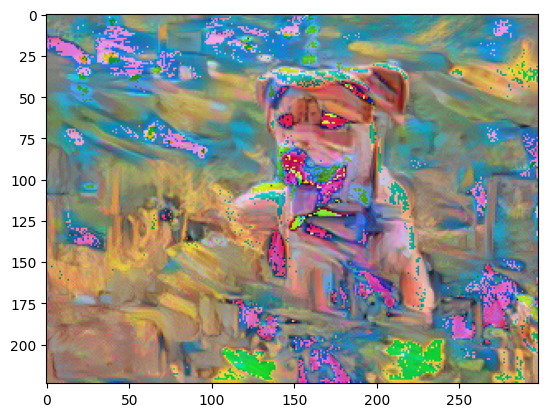

Total loss:  221722.59375


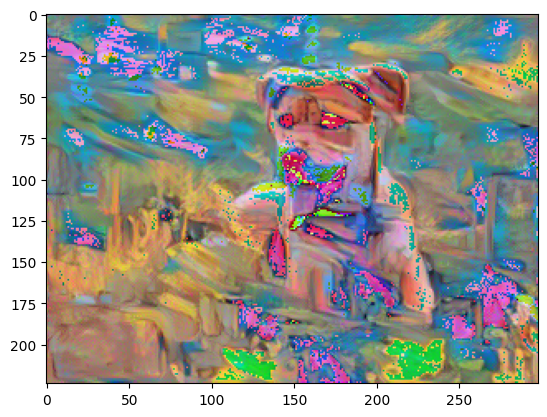

Total loss:  190269.28125


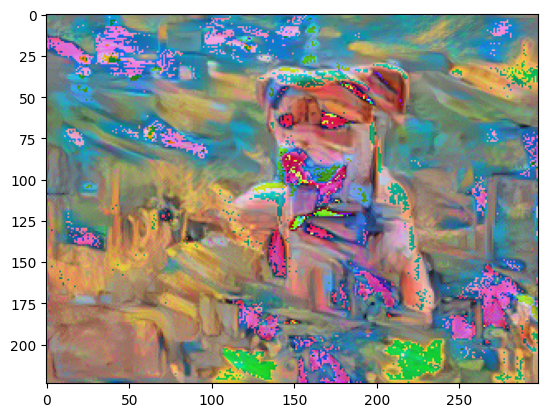

Total loss:  164119.59375


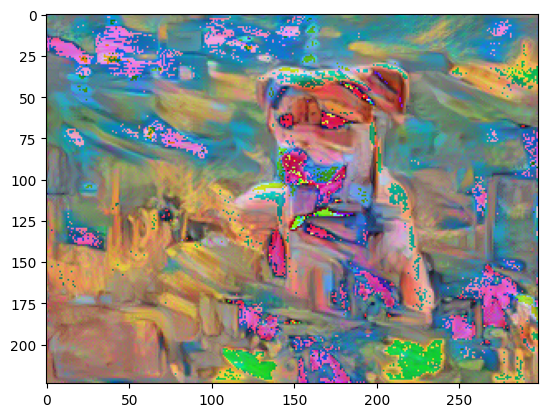

Total loss:  141909.890625


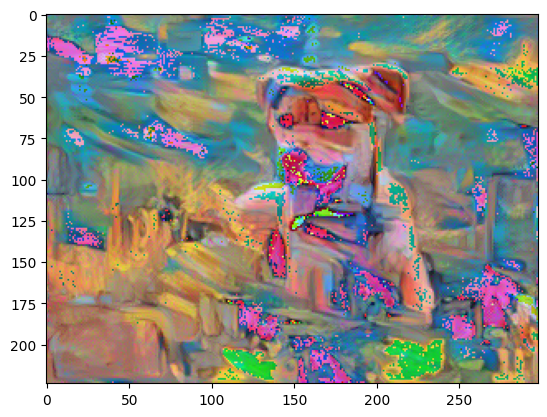

Total loss:  122804.8359375


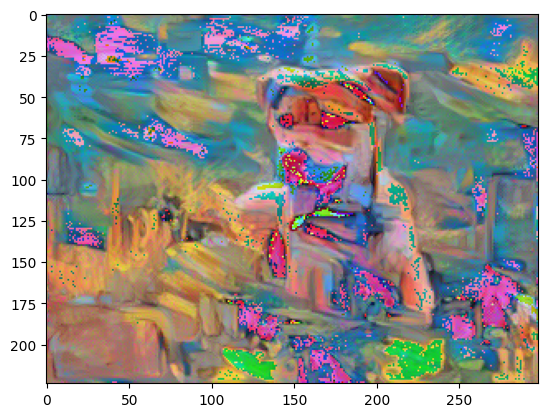

Total loss:  106272.6171875


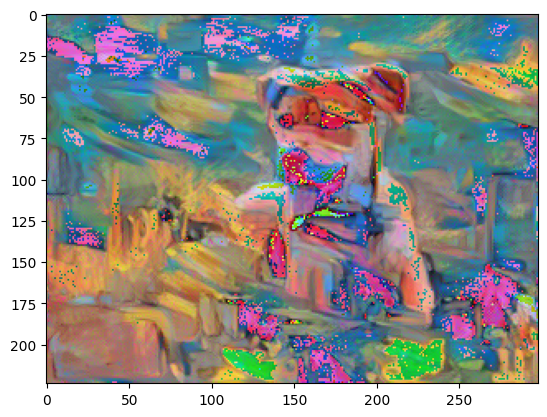

Total loss:  92106.75


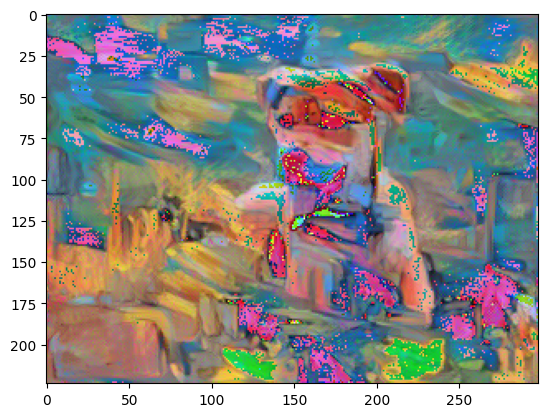

Total loss:  80078.1171875


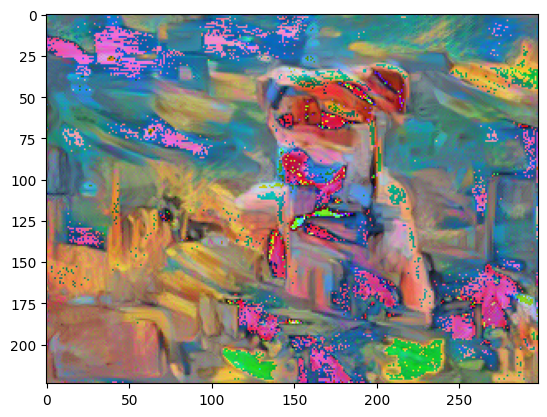

Total loss:  69966.1484375


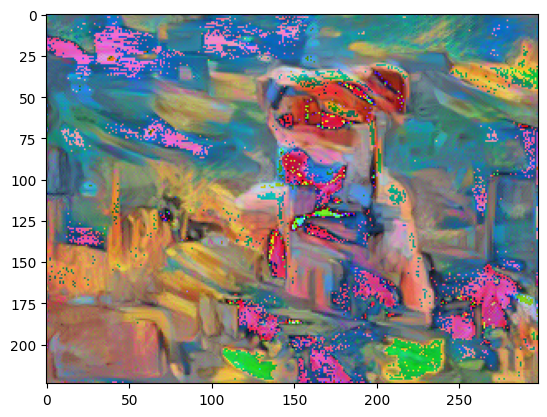

Total loss:  61522.7578125


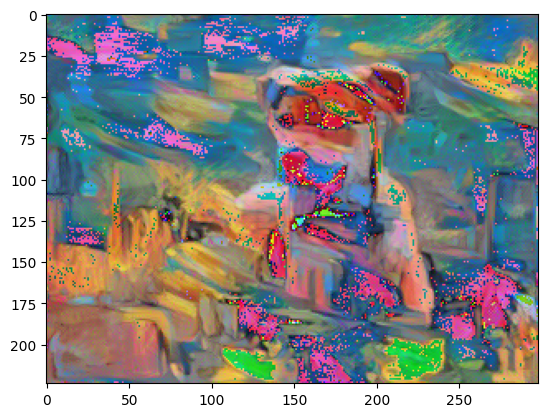

Total loss:  54596.609375


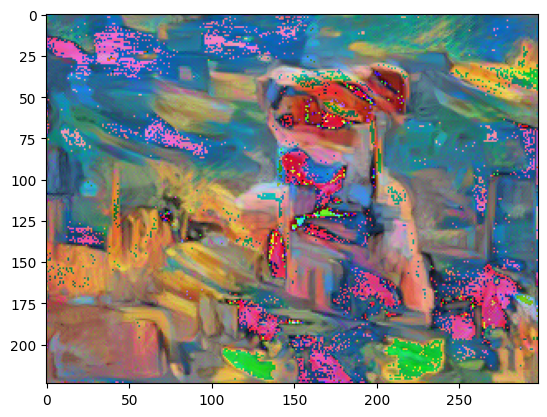

In [191]:
for i in range(1, iterations+1):
    target_features = features_extractor(target_img, model, relevant_layers)
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2']) ** 2)
    
    style_losses = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        _, d1, d2, d3 = target_feature.shape
        target_reshaped = target_feature.view(d1, d2*d3)
        target_gram = torch.mm(target_reshaped, target_reshaped.t())
        style_gram = style_grams[layer]
        style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_losses += style_loss / (d1 * d2 * d3)
        
    total_loss = alpha * content_loss + beta * style_losses
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if i % print_statement == 0 or i == 1:
        print('Total loss: ', total_loss.item())
        plt.imshow(tensor2image(target_img))
        plt.show()